In [2]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import itertools
import torchvision
from torch.utils.data import Dataset
import numpy as np
from torchvision import  transforms


尝试使用CycleGAN进行卡通人脸实现，人脸数据来自于[celeba—A](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html)，卡通人脸数据来自于[开源项目](https://github.com/minivision-ai/photo2cartoon)，参考(https://github.com/Lornatang/CycleGAN-PyTorch)

In [3]:
image_size = 256
batch_Size = 4
lr = 0.0002
epochs = 200
decay_epochs = 100 #epoch from which to start lr decay
print_freq = 10
device = 'cuda:1' if torch.cuda.is_available() else 'cpu'
#device = 'cpu'


In [4]:
trainA_dir = 'data/face/trainA/'
trainB_dir = 'data/face/trainB/'
testA_dir = 'data/face/testA/'
testB_dir = 'data/face/testB/'


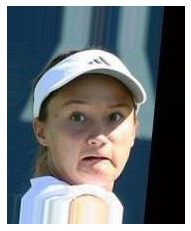

In [5]:
from PIL import Image
import matplotlib.pyplot as plt
import os
img = Image.open(os.path.join(trainA_dir ,os.listdir(trainA_dir)[0]))
plt.imshow(img)
plt.axis('off')
plt.show()


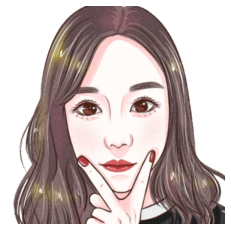

In [6]:
img = Image.open(os.path.join(trainB_dir ,os.listdir(trainB_dir)[0]))
plt.imshow(img)
plt.axis('off')
plt.show()

In [7]:
train_transform = transforms.Compose([#图像预处理的操作
                           transforms.Resize((int(image_size * 1.12),int(image_size * 1.12))),
                           transforms.RandomCrop(image_size),#随机裁剪
                           transforms.RandomHorizontalFlip(),
                           transforms.ToTensor(),
                           transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
                           ])
test_transform = transforms.Compose([
                           transforms.Resize((image_size,image_size)),
                           transforms.ToTensor(),
                           transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
                       ])

![](https://cdn.mathpix.com/snip/images/4VEAjWEc-FeUWH1w8I2OcqiwpKDIiaa-eIAlAQbqV84.original.fullsize.png)

In [8]:
class ImageDataset(Dataset):
    def __init__(self, A_dir,B_dir,transform):
        super(ImageDataset,self).__init__()
        self.files_A = os.listdir(A_dir)
        self.files_B = os.listdir(B_dir)
        self.A_dir = A_dir
        self.B_dir = B_dir
        
        self.transform = transform
    def __getitem__(self, idx):
        item_A = self.transform(Image.open(os.path.join(self.A_dir,self.files_A[idx % len(self.files_A)])).convert('RGB'))
        item_B = self.transform(Image.open(os.path.join(self.B_dir,self.files_B[idx % len(self.files_B)])).convert('RGB'))
        return {"A": item_A, "B": item_B}
    def __len__(self):
        return max(len(self.files_A), len(self.files_B))
    

In [9]:
train_set = ImageDataset(trainA_dir,trainB_dir,train_transform)
test_set = ImageDataset(testA_dir,testB_dir,test_transform)
train_loader =  torch.utils.data.DataLoader(train_set, batch_size=batch_Size, shuffle=True)
test_loader =  torch.utils.data.DataLoader(test_set, batch_size=batch_Size, shuffle=False)

In [9]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()

        self.main = nn.Sequential(
            nn.Conv2d(3, 64, 4, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(64, 128, 4, stride=2, padding=1),
            nn.InstanceNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(128, 256, 4, stride=2, padding=1),
            nn.InstanceNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
           
            nn.Conv2d(256, 512, 4, padding=1),
            nn.InstanceNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(512, 1, 4, padding=1),
        )#输出并不是一个数，而是通道数为1的小图

    def forward(self, x):
        x = self.main(x)
        x = F.avg_pool2d(x, x.size()[2:])#进行平均池化
        x = torch.flatten(x, 1)#batch_size,1
        return x

# 包含3个的卷积层
# 9个残差模块，每个残差块包含2个卷积层
# 两个微步卷积层
# 卷积层将特征映射为3通道GRB。
# 输入和输出的大小是一样的


class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.main = nn.Sequential(
            # Initial convolution block
            nn.ReflectionPad2d(3),#输入数据进行扩充
            nn.Conv2d(3, 64, 7),
            nn.InstanceNorm2d(64),#归一化层
            nn.ReLU(inplace=True),

            # Downsampling
            nn.Conv2d(64, 128, 3, stride=2, padding=1),
            nn.InstanceNorm2d(128),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 256, 3, stride=2, padding=1),
            nn.InstanceNorm2d(256),
            nn.ReLU(inplace=True),

            # Residual blocks
            ResidualBlock(256),
            ResidualBlock(256),
            ResidualBlock(256),
            ResidualBlock(256),
            ResidualBlock(256),
            ResidualBlock(256),
            ResidualBlock(256),
            ResidualBlock(256),
            ResidualBlock(256),

            # Upsampling
            nn.ConvTranspose2d(256, 128, 3, stride=2, padding=1, output_padding=1),
            nn.InstanceNorm2d(128),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(128, 64, 3, stride=2, padding=1, output_padding=1),
            nn.InstanceNorm2d(64),
            nn.ReLU(inplace=True),

            # Output layer
            nn.ReflectionPad2d(3),
            nn.Conv2d(64, 3, 7),
            nn.Tanh()
        )

    def forward(self, x):
        return self.main(x)


class ResidualBlock(nn.Module):
    def __init__(self, in_channels):
        super(ResidualBlock, self).__init__()

        self.res = nn.Sequential(nn.ReflectionPad2d(1),
                                 nn.Conv2d(in_channels, in_channels, 3),
                                 nn.InstanceNorm2d(in_channels),
                                 nn.ReLU(inplace=True),
                                 nn.ReflectionPad2d(1),
                                 nn.Conv2d(in_channels, in_channels, 3),
                                 nn.InstanceNorm2d(in_channels))

    def forward(self, x):
        return x + self.res(x)

In [10]:
#两个生成器两个判别器
netG_A2B = Generator().to(device)
netG_B2A = Generator().to(device)
netD_A = Discriminator().to(device)
netD_B = Discriminator().to(device)

G_A2B – 学习将A风格转换成B风格

G_A2B – 学习将B风格转换成A风格

D_A – 学习判断是否为A风格的图像

D_B -学习判断是否为B风格的图像

In [11]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find("Conv") != -1:
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    elif classname.find("BatchNorm") != -1:
        torch.nn.init.normal_(m.weight, 1.0, 0.02)
        torch.nn.init.zeros_(m.bias)
netG_A2B.apply(weights_init)
netG_B2A.apply(weights_init)
netD_A.apply(weights_init)
netD_B.apply(weights_init)
#损失函数
cycle_loss = torch.nn.L1Loss()#循环一致性损失
identity_loss = torch.nn.L1Loss()#是否能重新建构 以G_A2B来说，是否在丢入 real_B的图片后，确实能输出B风格的图片，是否能保持原样
adversarial_loss = torch.nn.MSELoss()#GAN损失


In [12]:
optimizer_G = torch.optim.Adam(itertools.chain(netG_A2B.parameters(), netG_B2A.parameters()),
                               lr=lr, betas=(0.5, 0.999))
optimizer_D_A = torch.optim.Adam(netD_A.parameters(), lr=lr, betas=(0.5, 0.999))
optimizer_D_B = torch.optim.Adam(netD_B.parameters(), lr=lr, betas=(0.5, 0.999))

In [4]:
#学习率衰减：
class DecayLR:
    def __init__(self, epochs, offset, decay_epochs):
        epoch_flag = epochs - decay_epochs
        assert (epoch_flag > 0), "Decay must start before the training session ends!"
        self.epochs = epochs
        self.offset = offset
        self.decay_epochs = decay_epochs

    def step(self, epoch):
        return 1.0 - max(0, epoch + self.offset - self.decay_epochs) / (
                self.epochs - self.decay_epochs)

In [14]:
lr_lambda = DecayLR(epochs, 0,decay_epochs).step
lr_scheduler_G = torch.optim.lr_scheduler.LambdaLR(optimizer_G, lr_lambda=lr_lambda)
lr_scheduler_D_A = torch.optim.lr_scheduler.LambdaLR(optimizer_D_A, lr_lambda=lr_lambda)
lr_scheduler_D_B = torch.optim.lr_scheduler.LambdaLR(optimizer_D_B, lr_lambda=lr_lambda)
# torch.optim.lr_scheduler.LambdaLR里面有一个参数lr_lambda是要输入学习率，
# 这个学习率是动态变化的，由LambdaLR(opt.n_epochs, opt.epoch, opt.decay_epoch).step来获得。


[lr_scheduler](https://blog.csdn.net/qyhaill/article/details/103043637)

In [15]:
#ReplayBuffer概念比较像是储存50张生成的图像并且从其中随机抓取来做预测，目的可能是利用历史样本，防止模式坍塌
#不使用也是可以的
import random
class ReplayBuffer:
    def __init__(self, max_size=50):
        assert (max_size > 0), "Empty buffer or trying to create a black hole. Be careful."
        self.max_size = max_size
        self.data = []

    def push_and_pop(self, data):
        to_return = []
        for element in data.data:
            element = torch.unsqueeze(element, 0)
            if len(self.data) < self.max_size:
                self.data.append(element)
                to_return.append(element)
            else:
                if random.uniform(0, 1) > 0.5:
                    i = random.randint(0, self.max_size - 1)
                    to_return.append(self.data[i].clone())
                    self.data[i] = element
                else:
                    to_return.append(element)
        return torch.cat(to_return)

In [16]:
g_losses = []
d_losses = []

identity_losses = []
gan_losses = []
cycle_losses = []

fake_A_buffer = ReplayBuffer()
fake_B_buffer = ReplayBuffer()

[0/199][0/25] Loss_D: 1.9064 Loss_G: 27.0205 Loss_G_identity: 7.7737 loss_G_GAN: 3.6875 loss_G_cycle: 15.5593
[0/199][10/25] Loss_D: 0.2422 Loss_G: 7.2094 Loss_G_identity: 1.8525 loss_G_GAN: 1.1960 loss_G_cycle: 4.1609
[0/199][20/25] Loss_D: 0.3551 Loss_G: 8.4537 Loss_G_identity: 2.3446 loss_G_GAN: 0.8845 loss_G_cycle: 5.2246


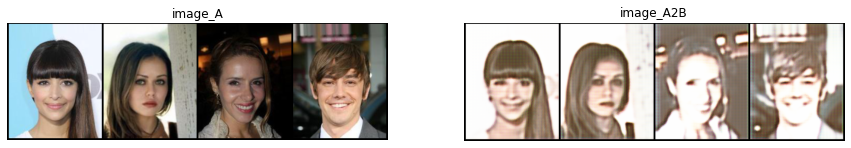

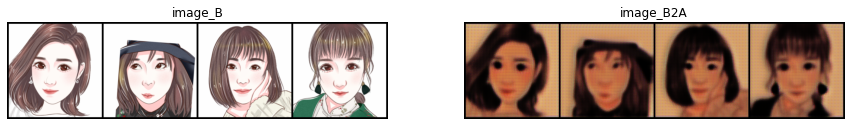

[1/199][0/25] Loss_D: 0.2237 Loss_G: 6.8478 Loss_G_identity: 2.0008 loss_G_GAN: 0.4272 loss_G_cycle: 4.4197
[1/199][10/25] Loss_D: 0.5421 Loss_G: 7.5177 Loss_G_identity: 1.7808 loss_G_GAN: 1.5084 loss_G_cycle: 4.2286
[1/199][20/25] Loss_D: 0.2698 Loss_G: 6.8974 Loss_G_identity: 1.8170 loss_G_GAN: 1.0384 loss_G_cycle: 4.0420
[2/199][0/25] Loss_D: 0.3014 Loss_G: 6.8574 Loss_G_identity: 1.8042 loss_G_GAN: 1.0473 loss_G_cycle: 4.0059
[2/199][10/25] Loss_D: 0.4491 Loss_G: 6.0095 Loss_G_identity: 1.4994 loss_G_GAN: 1.1217 loss_G_cycle: 3.3884
[2/199][20/25] Loss_D: 0.5785 Loss_G: 5.8725 Loss_G_identity: 1.4211 loss_G_GAN: 0.8791 loss_G_cycle: 3.5724
[3/199][0/25] Loss_D: 0.4031 Loss_G: 6.3418 Loss_G_identity: 1.7576 loss_G_GAN: 0.4734 loss_G_cycle: 4.1108
[3/199][10/25] Loss_D: 0.4657 Loss_G: 6.3218 Loss_G_identity: 1.4410 loss_G_GAN: 1.4825 loss_G_cycle: 3.3983
[3/199][20/25] Loss_D: 0.2025 Loss_G: 6.8098 Loss_G_identity: 1.8453 loss_G_GAN: 1.1492 loss_G_cycle: 3.8153
[4/199][0/25] Loss_D: 

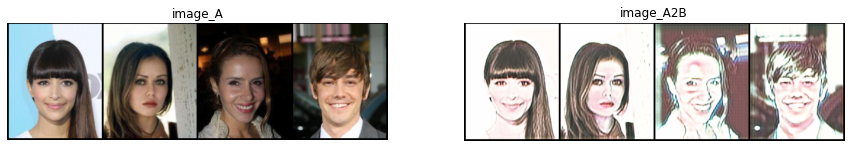

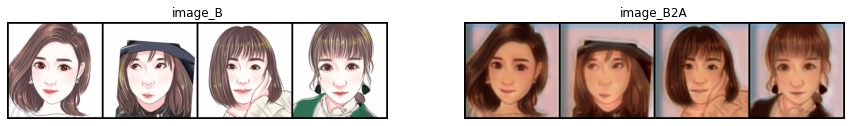

[11/199][0/25] Loss_D: 0.4687 Loss_G: 6.3863 Loss_G_identity: 1.7453 loss_G_GAN: 0.9223 loss_G_cycle: 3.7186
[11/199][10/25] Loss_D: 0.1511 Loss_G: 6.1760 Loss_G_identity: 1.6842 loss_G_GAN: 1.2272 loss_G_cycle: 3.2646
[11/199][20/25] Loss_D: 0.5478 Loss_G: 5.5282 Loss_G_identity: 1.4148 loss_G_GAN: 0.7831 loss_G_cycle: 3.3303
[12/199][0/25] Loss_D: 0.1227 Loss_G: 5.7918 Loss_G_identity: 1.4883 loss_G_GAN: 1.0112 loss_G_cycle: 3.2924
[12/199][10/25] Loss_D: 0.2473 Loss_G: 6.0506 Loss_G_identity: 1.5708 loss_G_GAN: 0.9968 loss_G_cycle: 3.4830
[12/199][20/25] Loss_D: 0.1142 Loss_G: 6.1200 Loss_G_identity: 1.2485 loss_G_GAN: 1.4913 loss_G_cycle: 3.3802
[13/199][0/25] Loss_D: 0.1748 Loss_G: 4.9363 Loss_G_identity: 1.0748 loss_G_GAN: 1.2811 loss_G_cycle: 2.5804
[13/199][10/25] Loss_D: 0.3060 Loss_G: 5.3626 Loss_G_identity: 1.2923 loss_G_GAN: 1.3020 loss_G_cycle: 2.7683
[13/199][20/25] Loss_D: 0.5542 Loss_G: 5.5255 Loss_G_identity: 1.4789 loss_G_GAN: 1.0547 loss_G_cycle: 2.9919
[14/199][0/25

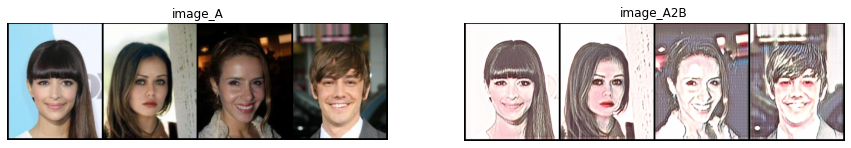

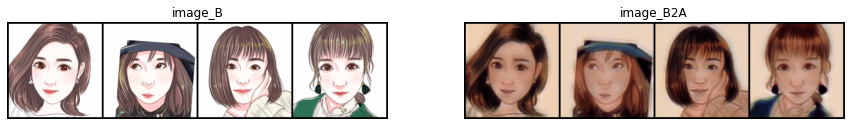

[21/199][0/25] Loss_D: 1.0542 Loss_G: 5.1724 Loss_G_identity: 1.0265 loss_G_GAN: 1.9502 loss_G_cycle: 2.1957
[21/199][10/25] Loss_D: 0.1682 Loss_G: 5.8024 Loss_G_identity: 1.3511 loss_G_GAN: 1.5442 loss_G_cycle: 2.9071
[21/199][20/25] Loss_D: 0.3448 Loss_G: 4.5855 Loss_G_identity: 1.2133 loss_G_GAN: 0.7874 loss_G_cycle: 2.5848
[22/199][0/25] Loss_D: 0.3404 Loss_G: 5.1260 Loss_G_identity: 1.2673 loss_G_GAN: 1.3883 loss_G_cycle: 2.4704
[22/199][10/25] Loss_D: 0.2362 Loss_G: 4.5343 Loss_G_identity: 0.9794 loss_G_GAN: 1.0984 loss_G_cycle: 2.4564
[22/199][20/25] Loss_D: 0.4642 Loss_G: 4.5314 Loss_G_identity: 1.1096 loss_G_GAN: 0.9676 loss_G_cycle: 2.4542
[23/199][0/25] Loss_D: 0.2890 Loss_G: 5.2776 Loss_G_identity: 1.4190 loss_G_GAN: 0.5949 loss_G_cycle: 3.2637
[23/199][10/25] Loss_D: 0.2976 Loss_G: 4.6083 Loss_G_identity: 1.1583 loss_G_GAN: 0.7530 loss_G_cycle: 2.6970
[23/199][20/25] Loss_D: 0.2487 Loss_G: 4.7776 Loss_G_identity: 1.2620 loss_G_GAN: 0.8144 loss_G_cycle: 2.7011
[24/199][0/25

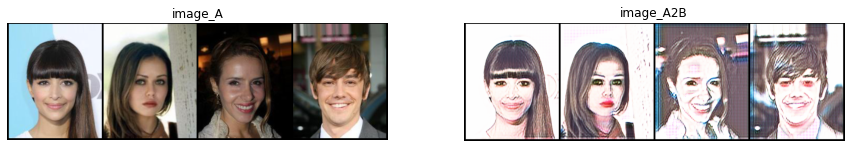

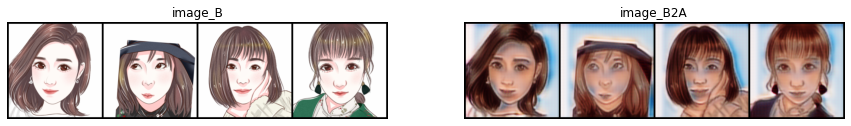

[31/199][0/25] Loss_D: 0.1858 Loss_G: 4.5741 Loss_G_identity: 1.1147 loss_G_GAN: 0.9312 loss_G_cycle: 2.5282
[31/199][10/25] Loss_D: 0.1794 Loss_G: 4.5987 Loss_G_identity: 0.9813 loss_G_GAN: 1.1192 loss_G_cycle: 2.4982
[31/199][20/25] Loss_D: 0.2539 Loss_G: 4.1790 Loss_G_identity: 0.9515 loss_G_GAN: 1.0610 loss_G_cycle: 2.1665
[32/199][0/25] Loss_D: 0.1188 Loss_G: 5.3799 Loss_G_identity: 1.1822 loss_G_GAN: 1.0116 loss_G_cycle: 3.1860
[32/199][10/25] Loss_D: 0.2573 Loss_G: 4.5389 Loss_G_identity: 1.1281 loss_G_GAN: 0.6947 loss_G_cycle: 2.7161
[32/199][20/25] Loss_D: 0.2674 Loss_G: 4.6698 Loss_G_identity: 1.0720 loss_G_GAN: 1.0392 loss_G_cycle: 2.5585
[33/199][0/25] Loss_D: 0.2720 Loss_G: 6.3345 Loss_G_identity: 1.4365 loss_G_GAN: 1.2636 loss_G_cycle: 3.6345
[33/199][10/25] Loss_D: 0.1081 Loss_G: 4.5369 Loss_G_identity: 1.0254 loss_G_GAN: 1.0258 loss_G_cycle: 2.4857
[33/199][20/25] Loss_D: 0.2092 Loss_G: 5.9065 Loss_G_identity: 1.3072 loss_G_GAN: 1.6192 loss_G_cycle: 2.9801
[34/199][0/25

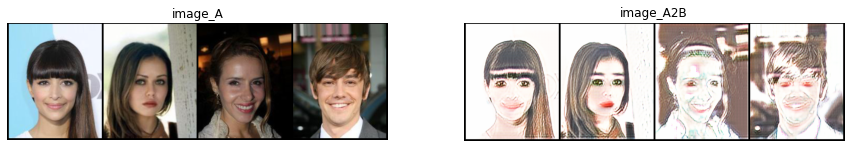

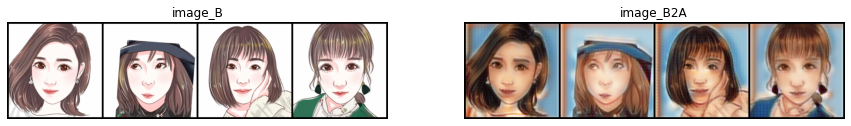

[41/199][0/25] Loss_D: 0.2621 Loss_G: 7.0161 Loss_G_identity: 1.5048 loss_G_GAN: 0.9072 loss_G_cycle: 4.6041
[41/199][10/25] Loss_D: 0.1870 Loss_G: 4.0904 Loss_G_identity: 0.8911 loss_G_GAN: 1.0850 loss_G_cycle: 2.1143
[41/199][20/25] Loss_D: 0.2135 Loss_G: 4.1722 Loss_G_identity: 0.9019 loss_G_GAN: 1.0878 loss_G_cycle: 2.1825
[42/199][0/25] Loss_D: 0.6902 Loss_G: 4.9010 Loss_G_identity: 1.3261 loss_G_GAN: 0.6124 loss_G_cycle: 2.9626
[42/199][10/25] Loss_D: 0.2723 Loss_G: 5.5559 Loss_G_identity: 1.1999 loss_G_GAN: 1.4021 loss_G_cycle: 2.9539
[42/199][20/25] Loss_D: 0.3169 Loss_G: 4.4659 Loss_G_identity: 0.8549 loss_G_GAN: 1.5420 loss_G_cycle: 2.0691
[43/199][0/25] Loss_D: 0.1945 Loss_G: 4.5537 Loss_G_identity: 0.9636 loss_G_GAN: 0.9705 loss_G_cycle: 2.6197
[43/199][10/25] Loss_D: 0.3277 Loss_G: 5.0349 Loss_G_identity: 1.1417 loss_G_GAN: 0.9621 loss_G_cycle: 2.9310
[43/199][20/25] Loss_D: 0.2181 Loss_G: 5.0269 Loss_G_identity: 1.0636 loss_G_GAN: 1.3811 loss_G_cycle: 2.5822
[44/199][0/25

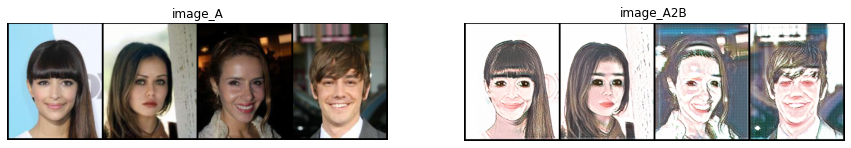

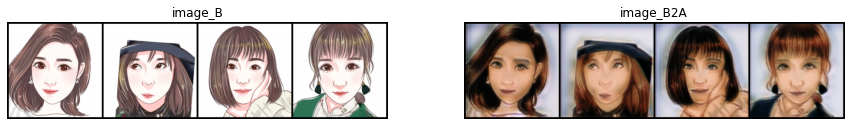

[51/199][0/25] Loss_D: 0.7717 Loss_G: 5.7733 Loss_G_identity: 0.9916 loss_G_GAN: 2.4451 loss_G_cycle: 2.3365
[51/199][10/25] Loss_D: 0.1093 Loss_G: 4.2766 Loss_G_identity: 0.9816 loss_G_GAN: 0.9385 loss_G_cycle: 2.3566
[51/199][20/25] Loss_D: 0.3460 Loss_G: 4.0680 Loss_G_identity: 1.0744 loss_G_GAN: 0.3949 loss_G_cycle: 2.5987
[52/199][0/25] Loss_D: 0.2343 Loss_G: 4.9755 Loss_G_identity: 1.0776 loss_G_GAN: 1.5021 loss_G_cycle: 2.3958
[52/199][10/25] Loss_D: 0.4725 Loss_G: 4.5327 Loss_G_identity: 1.1327 loss_G_GAN: 0.9248 loss_G_cycle: 2.4752
[52/199][20/25] Loss_D: 0.3468 Loss_G: 4.5906 Loss_G_identity: 0.9726 loss_G_GAN: 1.2510 loss_G_cycle: 2.3670
[53/199][0/25] Loss_D: 0.1405 Loss_G: 5.7949 Loss_G_identity: 1.0686 loss_G_GAN: 1.5421 loss_G_cycle: 3.1842
[53/199][10/25] Loss_D: 0.1315 Loss_G: 6.1542 Loss_G_identity: 1.1752 loss_G_GAN: 1.9028 loss_G_cycle: 3.0763
[53/199][20/25] Loss_D: 0.1529 Loss_G: 4.2166 Loss_G_identity: 1.0476 loss_G_GAN: 0.8375 loss_G_cycle: 2.3315
[54/199][0/25

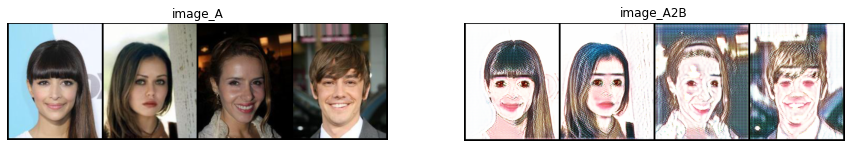

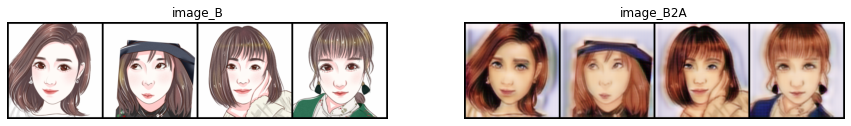

[61/199][0/25] Loss_D: 0.6307 Loss_G: 5.4049 Loss_G_identity: 1.1099 loss_G_GAN: 1.5183 loss_G_cycle: 2.7767
[61/199][10/25] Loss_D: 0.1439 Loss_G: 3.9640 Loss_G_identity: 0.9441 loss_G_GAN: 0.9176 loss_G_cycle: 2.1023
[61/199][20/25] Loss_D: 0.0769 Loss_G: 5.8257 Loss_G_identity: 0.9625 loss_G_GAN: 2.3099 loss_G_cycle: 2.5532
[62/199][0/25] Loss_D: 0.3569 Loss_G: 5.5444 Loss_G_identity: 1.1851 loss_G_GAN: 1.7496 loss_G_cycle: 2.6097
[62/199][10/25] Loss_D: 0.1544 Loss_G: 4.6799 Loss_G_identity: 1.0004 loss_G_GAN: 1.4530 loss_G_cycle: 2.2264
[62/199][20/25] Loss_D: 0.2409 Loss_G: 4.7735 Loss_G_identity: 0.8812 loss_G_GAN: 1.6487 loss_G_cycle: 2.2436
[63/199][0/25] Loss_D: 0.2815 Loss_G: 6.1730 Loss_G_identity: 1.3831 loss_G_GAN: 1.6052 loss_G_cycle: 3.1847
[63/199][10/25] Loss_D: 0.1612 Loss_G: 3.9504 Loss_G_identity: 0.8335 loss_G_GAN: 1.1400 loss_G_cycle: 1.9769
[63/199][20/25] Loss_D: 0.1856 Loss_G: 4.9204 Loss_G_identity: 0.8730 loss_G_GAN: 1.8814 loss_G_cycle: 2.1660
[64/199][0/25

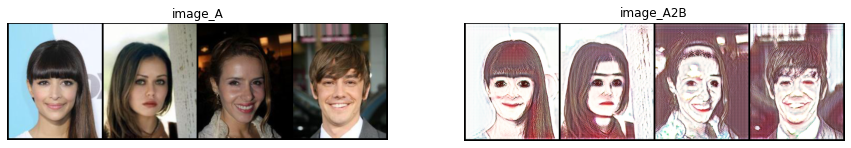

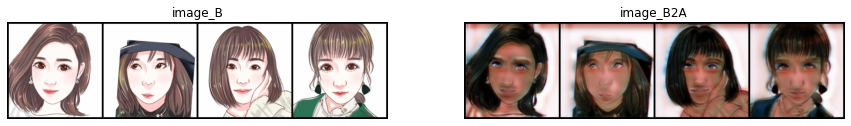

[71/199][0/25] Loss_D: 0.5576 Loss_G: 5.1630 Loss_G_identity: 1.2459 loss_G_GAN: 0.5504 loss_G_cycle: 3.3667
[71/199][10/25] Loss_D: 0.1096 Loss_G: 4.6798 Loss_G_identity: 0.9263 loss_G_GAN: 1.2287 loss_G_cycle: 2.5249
[71/199][20/25] Loss_D: 0.3809 Loss_G: 4.2396 Loss_G_identity: 0.9942 loss_G_GAN: 0.8745 loss_G_cycle: 2.3709
[72/199][0/25] Loss_D: 0.2446 Loss_G: 4.5611 Loss_G_identity: 0.8884 loss_G_GAN: 1.4261 loss_G_cycle: 2.2465
[72/199][10/25] Loss_D: 0.1332 Loss_G: 4.4738 Loss_G_identity: 0.9926 loss_G_GAN: 1.0765 loss_G_cycle: 2.4047
[72/199][20/25] Loss_D: 0.2496 Loss_G: 4.3862 Loss_G_identity: 0.8441 loss_G_GAN: 1.5147 loss_G_cycle: 2.0275
[73/199][0/25] Loss_D: 0.1512 Loss_G: 5.0160 Loss_G_identity: 1.0315 loss_G_GAN: 1.4910 loss_G_cycle: 2.4936
[73/199][10/25] Loss_D: 0.2548 Loss_G: 4.2998 Loss_G_identity: 1.0849 loss_G_GAN: 1.0076 loss_G_cycle: 2.2073
[73/199][20/25] Loss_D: 0.0895 Loss_G: 4.0922 Loss_G_identity: 0.9561 loss_G_GAN: 0.7664 loss_G_cycle: 2.3697
[74/199][0/25

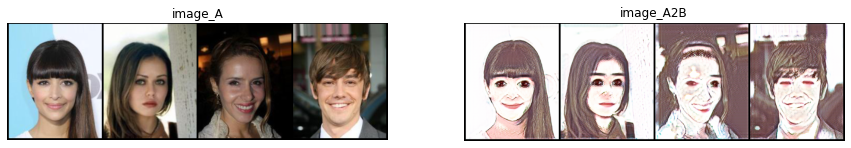

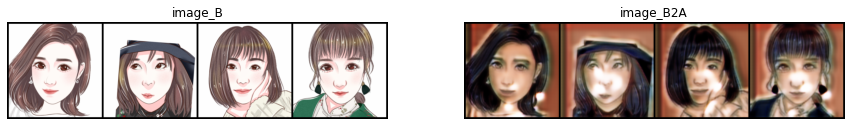

[81/199][0/25] Loss_D: 0.2533 Loss_G: 4.9782 Loss_G_identity: 1.1456 loss_G_GAN: 1.2650 loss_G_cycle: 2.5676
[81/199][10/25] Loss_D: 0.1233 Loss_G: 4.6497 Loss_G_identity: 0.8846 loss_G_GAN: 1.5349 loss_G_cycle: 2.2302
[81/199][20/25] Loss_D: 0.2967 Loss_G: 3.8474 Loss_G_identity: 0.7455 loss_G_GAN: 0.7223 loss_G_cycle: 2.3796
[82/199][0/25] Loss_D: 0.2969 Loss_G: 4.7631 Loss_G_identity: 0.9464 loss_G_GAN: 1.1891 loss_G_cycle: 2.6276
[82/199][10/25] Loss_D: 0.3619 Loss_G: 3.8572 Loss_G_identity: 0.9476 loss_G_GAN: 0.3440 loss_G_cycle: 2.5656
[82/199][20/25] Loss_D: 0.1625 Loss_G: 4.2066 Loss_G_identity: 1.0054 loss_G_GAN: 1.1659 loss_G_cycle: 2.0353
[83/199][0/25] Loss_D: 0.0999 Loss_G: 4.9247 Loss_G_identity: 0.9673 loss_G_GAN: 1.4714 loss_G_cycle: 2.4859
[83/199][10/25] Loss_D: 0.1841 Loss_G: 4.4357 Loss_G_identity: 0.7845 loss_G_GAN: 1.4434 loss_G_cycle: 2.2078
[83/199][20/25] Loss_D: 0.2059 Loss_G: 5.0188 Loss_G_identity: 1.0327 loss_G_GAN: 1.4392 loss_G_cycle: 2.5469
[84/199][0/25

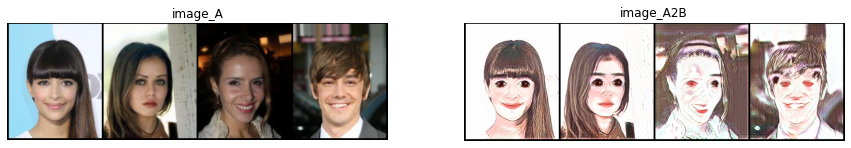

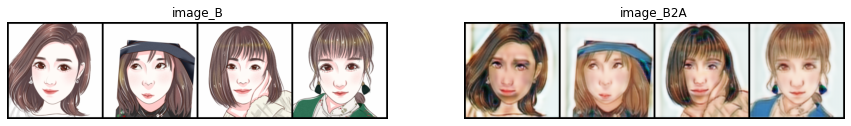

[91/199][0/25] Loss_D: 0.1646 Loss_G: 5.7986 Loss_G_identity: 1.0710 loss_G_GAN: 1.6410 loss_G_cycle: 3.0867
[91/199][10/25] Loss_D: 0.3100 Loss_G: 4.1586 Loss_G_identity: 0.9532 loss_G_GAN: 1.1985 loss_G_cycle: 2.0069
[91/199][20/25] Loss_D: 0.0849 Loss_G: 4.2982 Loss_G_identity: 0.9101 loss_G_GAN: 1.1064 loss_G_cycle: 2.2818
[92/199][0/25] Loss_D: 0.1513 Loss_G: 4.0213 Loss_G_identity: 0.9623 loss_G_GAN: 0.8686 loss_G_cycle: 2.1904
[92/199][10/25] Loss_D: 0.0981 Loss_G: 5.2811 Loss_G_identity: 1.1201 loss_G_GAN: 1.2865 loss_G_cycle: 2.8745
[92/199][20/25] Loss_D: 0.1674 Loss_G: 5.6770 Loss_G_identity: 1.2480 loss_G_GAN: 1.8499 loss_G_cycle: 2.5791
[93/199][0/25] Loss_D: 0.2500 Loss_G: 5.5657 Loss_G_identity: 1.0406 loss_G_GAN: 1.6677 loss_G_cycle: 2.8574
[93/199][10/25] Loss_D: 0.1511 Loss_G: 4.0894 Loss_G_identity: 0.9233 loss_G_GAN: 0.9413 loss_G_cycle: 2.2248
[93/199][20/25] Loss_D: 0.4012 Loss_G: 5.0325 Loss_G_identity: 0.8944 loss_G_GAN: 1.8637 loss_G_cycle: 2.2743
[94/199][0/25

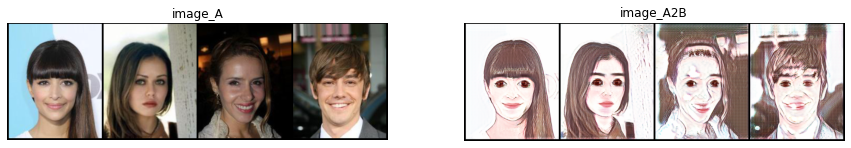

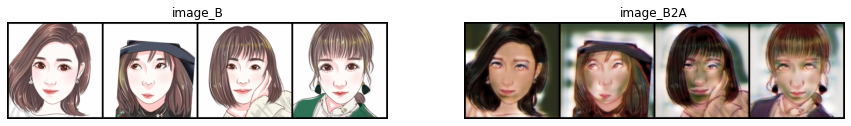

[101/199][0/25] Loss_D: 0.3052 Loss_G: 4.1593 Loss_G_identity: 0.9201 loss_G_GAN: 0.6232 loss_G_cycle: 2.6160
[101/199][10/25] Loss_D: 0.1582 Loss_G: 3.9660 Loss_G_identity: 0.7106 loss_G_GAN: 1.4685 loss_G_cycle: 1.7869
[101/199][20/25] Loss_D: 0.2841 Loss_G: 4.8100 Loss_G_identity: 0.9192 loss_G_GAN: 1.3839 loss_G_cycle: 2.5068
[102/199][0/25] Loss_D: 0.8225 Loss_G: 8.3360 Loss_G_identity: 2.0036 loss_G_GAN: 1.1701 loss_G_cycle: 5.1623
[102/199][10/25] Loss_D: 0.2699 Loss_G: 5.5563 Loss_G_identity: 1.2265 loss_G_GAN: 1.8633 loss_G_cycle: 2.4665
[102/199][20/25] Loss_D: 0.2106 Loss_G: 4.1007 Loss_G_identity: 1.0370 loss_G_GAN: 0.6509 loss_G_cycle: 2.4128
[103/199][0/25] Loss_D: 0.1452 Loss_G: 4.5016 Loss_G_identity: 0.8859 loss_G_GAN: 1.4826 loss_G_cycle: 2.1331
[103/199][10/25] Loss_D: 0.2186 Loss_G: 4.2052 Loss_G_identity: 0.8136 loss_G_GAN: 1.2961 loss_G_cycle: 2.0955
[103/199][20/25] Loss_D: 0.0845 Loss_G: 4.9383 Loss_G_identity: 0.9251 loss_G_GAN: 1.4176 loss_G_cycle: 2.5955
[104

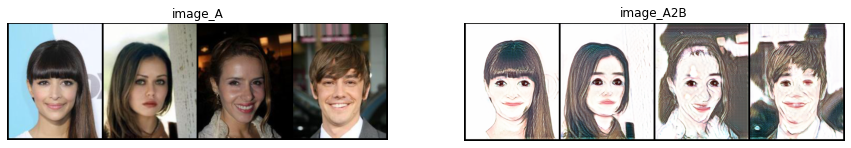

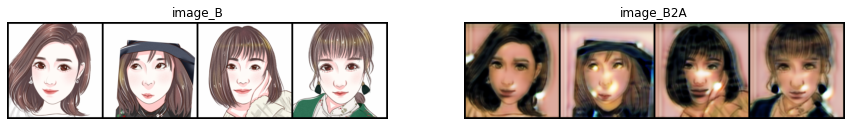

[111/199][0/25] Loss_D: 0.2070 Loss_G: 4.7590 Loss_G_identity: 0.9489 loss_G_GAN: 1.2735 loss_G_cycle: 2.5366
[111/199][10/25] Loss_D: 0.1674 Loss_G: 3.8642 Loss_G_identity: 0.9078 loss_G_GAN: 0.6261 loss_G_cycle: 2.3303
[111/199][20/25] Loss_D: 0.1926 Loss_G: 3.3730 Loss_G_identity: 0.9103 loss_G_GAN: 0.3359 loss_G_cycle: 2.1268
[112/199][0/25] Loss_D: 0.1925 Loss_G: 3.9913 Loss_G_identity: 0.9532 loss_G_GAN: 0.5759 loss_G_cycle: 2.4622
[112/199][10/25] Loss_D: 0.1350 Loss_G: 4.3175 Loss_G_identity: 0.9156 loss_G_GAN: 1.1998 loss_G_cycle: 2.2021
[112/199][20/25] Loss_D: 0.3357 Loss_G: 3.8069 Loss_G_identity: 0.7469 loss_G_GAN: 1.2118 loss_G_cycle: 1.8482
[113/199][0/25] Loss_D: 0.2249 Loss_G: 6.2039 Loss_G_identity: 1.1770 loss_G_GAN: 1.3689 loss_G_cycle: 3.6580
[113/199][10/25] Loss_D: 0.1558 Loss_G: 4.5834 Loss_G_identity: 0.8339 loss_G_GAN: 1.7385 loss_G_cycle: 2.0110
[113/199][20/25] Loss_D: 0.3777 Loss_G: 3.9245 Loss_G_identity: 0.8797 loss_G_GAN: 0.8557 loss_G_cycle: 2.1890
[114

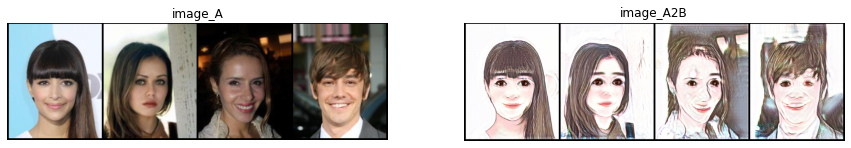

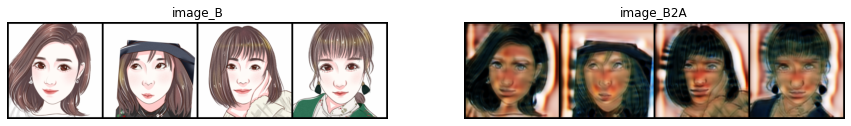

[121/199][0/25] Loss_D: 0.2104 Loss_G: 4.1625 Loss_G_identity: 0.9786 loss_G_GAN: 0.9914 loss_G_cycle: 2.1925
[121/199][10/25] Loss_D: 0.2224 Loss_G: 4.6504 Loss_G_identity: 0.8284 loss_G_GAN: 1.7451 loss_G_cycle: 2.0769
[121/199][20/25] Loss_D: 0.1841 Loss_G: 5.0503 Loss_G_identity: 1.0254 loss_G_GAN: 1.8941 loss_G_cycle: 2.1308
[122/199][0/25] Loss_D: 0.1920 Loss_G: 4.6223 Loss_G_identity: 0.7976 loss_G_GAN: 2.0049 loss_G_cycle: 1.8197
[122/199][10/25] Loss_D: 0.1449 Loss_G: 3.9426 Loss_G_identity: 0.7323 loss_G_GAN: 1.1769 loss_G_cycle: 2.0334
[122/199][20/25] Loss_D: 0.2860 Loss_G: 4.0910 Loss_G_identity: 0.7393 loss_G_GAN: 1.4050 loss_G_cycle: 1.9467
[123/199][0/25] Loss_D: 0.3065 Loss_G: 5.0311 Loss_G_identity: 0.8863 loss_G_GAN: 1.7531 loss_G_cycle: 2.3917
[123/199][10/25] Loss_D: 0.1538 Loss_G: 3.9398 Loss_G_identity: 0.7231 loss_G_GAN: 1.3512 loss_G_cycle: 1.8654
[123/199][20/25] Loss_D: 0.3062 Loss_G: 4.5366 Loss_G_identity: 1.1115 loss_G_GAN: 0.8798 loss_G_cycle: 2.5453
[124

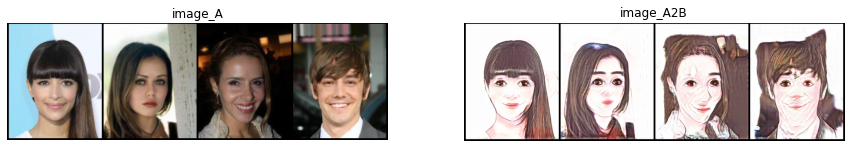

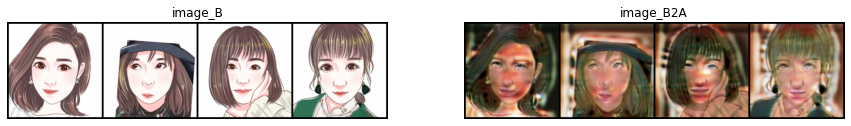

[131/199][0/25] Loss_D: 0.2383 Loss_G: 5.2865 Loss_G_identity: 0.9782 loss_G_GAN: 1.3871 loss_G_cycle: 2.9213
[131/199][10/25] Loss_D: 0.2394 Loss_G: 4.0833 Loss_G_identity: 0.8625 loss_G_GAN: 1.1822 loss_G_cycle: 2.0387
[131/199][20/25] Loss_D: 0.2937 Loss_G: 3.5107 Loss_G_identity: 0.7199 loss_G_GAN: 0.9377 loss_G_cycle: 1.8531
[132/199][0/25] Loss_D: 0.2760 Loss_G: 4.5491 Loss_G_identity: 0.8833 loss_G_GAN: 1.4702 loss_G_cycle: 2.1956
[132/199][10/25] Loss_D: 0.1597 Loss_G: 3.7042 Loss_G_identity: 0.8514 loss_G_GAN: 1.0002 loss_G_cycle: 1.8525
[132/199][20/25] Loss_D: 0.1964 Loss_G: 3.3570 Loss_G_identity: 0.8228 loss_G_GAN: 0.3965 loss_G_cycle: 2.1377
[133/199][0/25] Loss_D: 0.1732 Loss_G: 4.3049 Loss_G_identity: 0.8307 loss_G_GAN: 1.4938 loss_G_cycle: 1.9804
[133/199][10/25] Loss_D: 0.1428 Loss_G: 3.6044 Loss_G_identity: 0.7094 loss_G_GAN: 1.0350 loss_G_cycle: 1.8600
[133/199][20/25] Loss_D: 0.1331 Loss_G: 4.6547 Loss_G_identity: 0.9622 loss_G_GAN: 1.4574 loss_G_cycle: 2.2351
[134

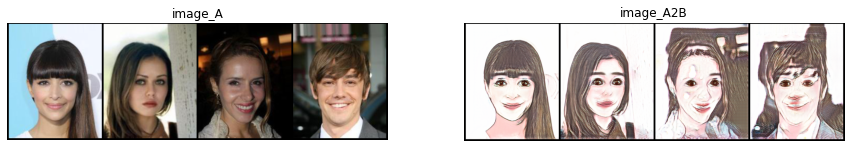

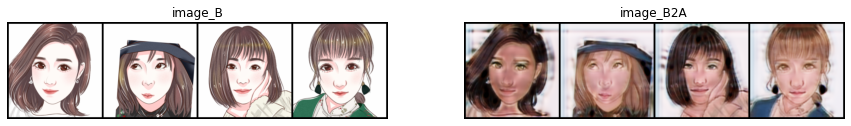

[141/199][0/25] Loss_D: 0.1087 Loss_G: 4.4028 Loss_G_identity: 0.8263 loss_G_GAN: 1.5646 loss_G_cycle: 2.0119
[141/199][10/25] Loss_D: 0.1517 Loss_G: 3.9782 Loss_G_identity: 0.7921 loss_G_GAN: 1.1907 loss_G_cycle: 1.9954
[141/199][20/25] Loss_D: 0.2807 Loss_G: 3.7545 Loss_G_identity: 0.6583 loss_G_GAN: 1.3367 loss_G_cycle: 1.7594
[142/199][0/25] Loss_D: 0.1406 Loss_G: 4.2501 Loss_G_identity: 0.7842 loss_G_GAN: 1.2990 loss_G_cycle: 2.1670
[142/199][10/25] Loss_D: 0.1793 Loss_G: 3.5804 Loss_G_identity: 0.6721 loss_G_GAN: 1.0904 loss_G_cycle: 1.8179
[142/199][20/25] Loss_D: 0.1862 Loss_G: 3.7791 Loss_G_identity: 0.8408 loss_G_GAN: 0.9684 loss_G_cycle: 1.9699
[143/199][0/25] Loss_D: 0.3594 Loss_G: 2.6009 Loss_G_identity: 0.5548 loss_G_GAN: 0.3762 loss_G_cycle: 1.6699
[143/199][10/25] Loss_D: 0.2784 Loss_G: 4.3260 Loss_G_identity: 0.8683 loss_G_GAN: 1.1628 loss_G_cycle: 2.2948
[143/199][20/25] Loss_D: 0.1637 Loss_G: 3.9526 Loss_G_identity: 0.7396 loss_G_GAN: 1.2545 loss_G_cycle: 1.9585
[144

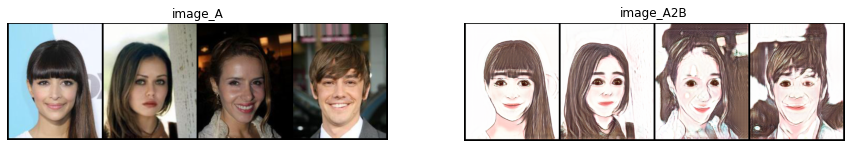

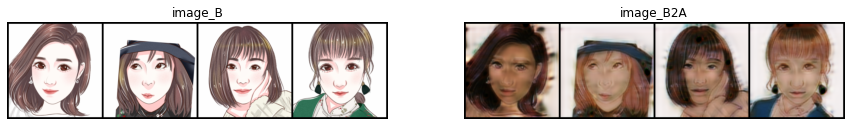

[151/199][0/25] Loss_D: 0.2796 Loss_G: 4.1643 Loss_G_identity: 0.7981 loss_G_GAN: 1.5729 loss_G_cycle: 1.7933
[151/199][10/25] Loss_D: 0.1531 Loss_G: 3.7966 Loss_G_identity: 0.7747 loss_G_GAN: 1.1359 loss_G_cycle: 1.8860
[151/199][20/25] Loss_D: 0.2124 Loss_G: 4.5488 Loss_G_identity: 0.8753 loss_G_GAN: 1.1535 loss_G_cycle: 2.5201
[152/199][0/25] Loss_D: 0.1302 Loss_G: 4.8468 Loss_G_identity: 0.7670 loss_G_GAN: 1.8433 loss_G_cycle: 2.2365
[152/199][10/25] Loss_D: 0.2117 Loss_G: 3.6191 Loss_G_identity: 0.7740 loss_G_GAN: 1.0217 loss_G_cycle: 1.8234
[152/199][20/25] Loss_D: 0.2298 Loss_G: 3.5143 Loss_G_identity: 0.7133 loss_G_GAN: 1.0495 loss_G_cycle: 1.7515
[153/199][0/25] Loss_D: 0.1441 Loss_G: 4.1371 Loss_G_identity: 0.6562 loss_G_GAN: 1.8308 loss_G_cycle: 1.6501
[153/199][10/25] Loss_D: 0.1637 Loss_G: 3.2212 Loss_G_identity: 0.6392 loss_G_GAN: 1.0108 loss_G_cycle: 1.5713
[153/199][20/25] Loss_D: 0.2980 Loss_G: 3.8650 Loss_G_identity: 0.8953 loss_G_GAN: 0.7844 loss_G_cycle: 2.1853
[154

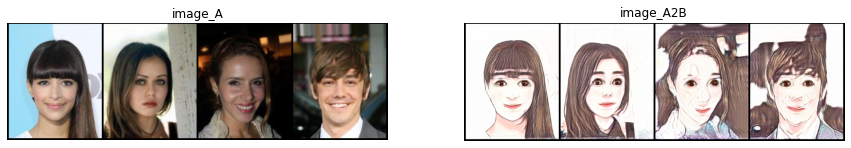

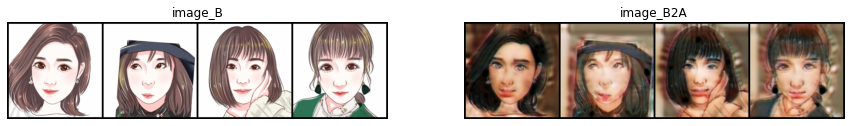

[161/199][0/25] Loss_D: 0.2008 Loss_G: 3.4979 Loss_G_identity: 0.7454 loss_G_GAN: 0.9425 loss_G_cycle: 1.8100
[161/199][10/25] Loss_D: 0.2227 Loss_G: 3.4418 Loss_G_identity: 0.6507 loss_G_GAN: 1.1918 loss_G_cycle: 1.5993
[161/199][20/25] Loss_D: 0.1655 Loss_G: 4.2764 Loss_G_identity: 0.8731 loss_G_GAN: 1.3265 loss_G_cycle: 2.0768
[162/199][0/25] Loss_D: 0.1361 Loss_G: 4.1066 Loss_G_identity: 0.7846 loss_G_GAN: 1.4262 loss_G_cycle: 1.8958
[162/199][10/25] Loss_D: 0.1463 Loss_G: 4.2596 Loss_G_identity: 0.6840 loss_G_GAN: 1.8469 loss_G_cycle: 1.7287
[162/199][20/25] Loss_D: 0.1276 Loss_G: 4.3330 Loss_G_identity: 0.7090 loss_G_GAN: 1.9155 loss_G_cycle: 1.7086
[163/199][0/25] Loss_D: 0.1405 Loss_G: 3.8785 Loss_G_identity: 0.8593 loss_G_GAN: 0.9820 loss_G_cycle: 2.0372
[163/199][10/25] Loss_D: 0.1154 Loss_G: 3.5914 Loss_G_identity: 0.6273 loss_G_GAN: 1.2518 loss_G_cycle: 1.7123
[163/199][20/25] Loss_D: 0.1163 Loss_G: 4.7457 Loss_G_identity: 0.8994 loss_G_GAN: 1.6954 loss_G_cycle: 2.1508
[164

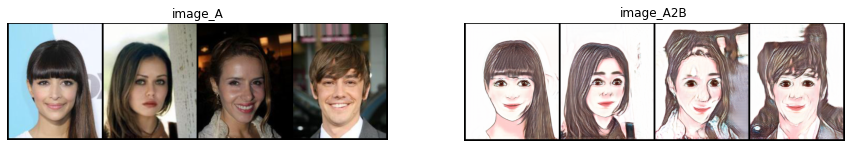

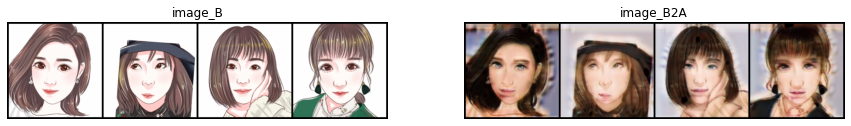

[171/199][0/25] Loss_D: 0.1932 Loss_G: 3.7426 Loss_G_identity: 0.7352 loss_G_GAN: 0.9436 loss_G_cycle: 2.0637
[171/199][10/25] Loss_D: 0.1504 Loss_G: 3.8143 Loss_G_identity: 0.7790 loss_G_GAN: 1.0343 loss_G_cycle: 2.0010
[171/199][20/25] Loss_D: 0.2019 Loss_G: 3.1961 Loss_G_identity: 0.5606 loss_G_GAN: 0.9702 loss_G_cycle: 1.6653
[172/199][0/25] Loss_D: 0.2669 Loss_G: 4.6027 Loss_G_identity: 0.6051 loss_G_GAN: 2.2015 loss_G_cycle: 1.7960
[172/199][10/25] Loss_D: 0.2780 Loss_G: 2.8231 Loss_G_identity: 0.6071 loss_G_GAN: 0.6168 loss_G_cycle: 1.5993
[172/199][20/25] Loss_D: 0.0839 Loss_G: 3.5882 Loss_G_identity: 0.7643 loss_G_GAN: 0.9610 loss_G_cycle: 1.8630
[173/199][0/25] Loss_D: 0.2119 Loss_G: 2.9853 Loss_G_identity: 0.5704 loss_G_GAN: 0.7649 loss_G_cycle: 1.6500
[173/199][10/25] Loss_D: 0.1992 Loss_G: 3.5442 Loss_G_identity: 0.7171 loss_G_GAN: 1.3552 loss_G_cycle: 1.4718
[173/199][20/25] Loss_D: 0.1881 Loss_G: 3.4901 Loss_G_identity: 0.7180 loss_G_GAN: 1.0505 loss_G_cycle: 1.7216
[174

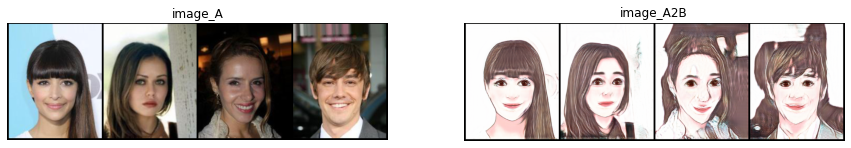

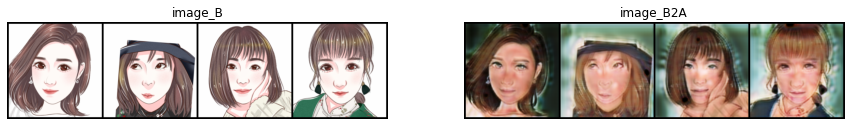

[181/199][0/25] Loss_D: 0.1383 Loss_G: 3.4627 Loss_G_identity: 0.5898 loss_G_GAN: 1.3371 loss_G_cycle: 1.5357
[181/199][10/25] Loss_D: 0.1108 Loss_G: 3.3604 Loss_G_identity: 0.6002 loss_G_GAN: 1.2924 loss_G_cycle: 1.4678
[181/199][20/25] Loss_D: 0.2118 Loss_G: 3.5053 Loss_G_identity: 0.7243 loss_G_GAN: 1.0528 loss_G_cycle: 1.7282
[182/199][0/25] Loss_D: 0.2279 Loss_G: 3.4148 Loss_G_identity: 0.6009 loss_G_GAN: 1.2152 loss_G_cycle: 1.5986
[182/199][10/25] Loss_D: 0.1478 Loss_G: 3.4916 Loss_G_identity: 0.7165 loss_G_GAN: 1.0695 loss_G_cycle: 1.7056
[182/199][20/25] Loss_D: 0.2412 Loss_G: 3.1394 Loss_G_identity: 0.5802 loss_G_GAN: 0.9241 loss_G_cycle: 1.6351
[183/199][0/25] Loss_D: 0.1761 Loss_G: 2.9612 Loss_G_identity: 0.5972 loss_G_GAN: 0.8280 loss_G_cycle: 1.5360
[183/199][10/25] Loss_D: 0.2011 Loss_G: 3.6941 Loss_G_identity: 0.8014 loss_G_GAN: 0.8988 loss_G_cycle: 1.9938
[183/199][20/25] Loss_D: 0.2094 Loss_G: 3.1659 Loss_G_identity: 0.5845 loss_G_GAN: 1.0701 loss_G_cycle: 1.5113
[184

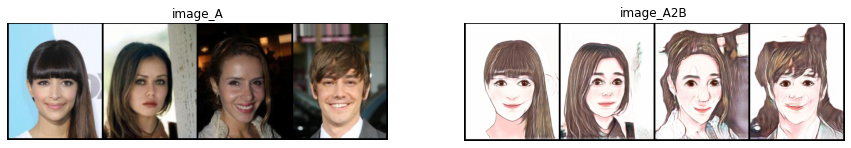

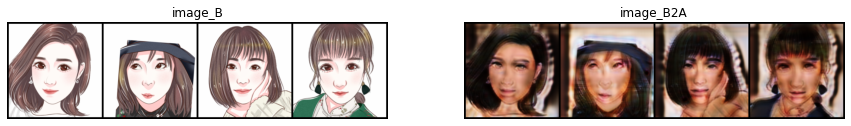

[191/199][0/25] Loss_D: 0.2108 Loss_G: 3.2287 Loss_G_identity: 0.6369 loss_G_GAN: 1.0219 loss_G_cycle: 1.5699
[191/199][10/25] Loss_D: 0.1579 Loss_G: 3.2196 Loss_G_identity: 0.5494 loss_G_GAN: 1.1974 loss_G_cycle: 1.4727
[191/199][20/25] Loss_D: 0.1975 Loss_G: 2.8247 Loss_G_identity: 0.5327 loss_G_GAN: 0.8808 loss_G_cycle: 1.4113
[192/199][0/25] Loss_D: 0.1929 Loss_G: 3.1452 Loss_G_identity: 0.6790 loss_G_GAN: 0.8871 loss_G_cycle: 1.5790
[192/199][10/25] Loss_D: 0.1705 Loss_G: 3.1169 Loss_G_identity: 0.6165 loss_G_GAN: 0.9796 loss_G_cycle: 1.5208
[192/199][20/25] Loss_D: 0.1077 Loss_G: 3.2790 Loss_G_identity: 0.6783 loss_G_GAN: 0.9528 loss_G_cycle: 1.6478
[193/199][0/25] Loss_D: 0.2186 Loss_G: 3.1535 Loss_G_identity: 0.6072 loss_G_GAN: 1.0560 loss_G_cycle: 1.4903
[193/199][10/25] Loss_D: 0.1671 Loss_G: 3.0885 Loss_G_identity: 0.5924 loss_G_GAN: 1.0635 loss_G_cycle: 1.4326
[193/199][20/25] Loss_D: 0.1091 Loss_G: 3.4537 Loss_G_identity: 0.6266 loss_G_GAN: 1.2415 loss_G_cycle: 1.5856
[194

In [17]:
test = next(iter(test_loader))
real_image_A1,real_image_B1 = test["A"], test["B"]#选出一组测试样本
for epoch in range(0, epochs):
    for i, data in enumerate(train_loader):
        # get batch size data
        real_image_A = data["A"].to(device)
        real_image_B = data["B"].to(device)
        batch_size = real_image_A.shape[0]

        # real data label is 1, fake data label is 0.
        real_label = torch.full((batch_size, 1), 1, device=device, dtype=torch.float32)
        fake_label = torch.full((batch_size, 1), 0, device=device, dtype=torch.float32)

        ##############################################
        # (1) Update G network: Generators A2B and B2A
        ##############################################

        # Set G_A and G_B's gradients to zero
        optimizer_G.zero_grad()

        # Identity loss 
        # G_B2A(A) should equal A if real A is fed
        identity_image_A = netG_B2A(real_image_A)
        loss_identity_A = identity_loss(identity_image_A, real_image_A) * 5.0
        # G_A2B(B) should equal B if real B is fed
        identity_image_B = netG_A2B(real_image_B)
        loss_identity_B = identity_loss(identity_image_B, real_image_B) * 5.0

        # GAN loss
        # GAN loss D_A(G_B2A(B))
        fake_image_A = netG_B2A(real_image_B)
        fake_output_A = netD_A(fake_image_A)
        loss_GAN_B2A = adversarial_loss(fake_output_A, real_label)
        # GAN loss D_B(G_A2B(A))
        fake_image_B = netG_A2B(real_image_A)
        fake_output_B = netD_B(fake_image_B)
        loss_GAN_A2B = adversarial_loss(fake_output_B, real_label)

        # Cycle loss
        recovered_image_A = netG_B2A(fake_image_B)
        loss_cycle_ABA = cycle_loss(recovered_image_A, real_image_A) * 10.0

        recovered_image_B = netG_A2B(fake_image_A)
        loss_cycle_BAB = cycle_loss(recovered_image_B, real_image_B) * 10.0

        # Combined loss and calculate gradients
        errG = loss_identity_A + loss_identity_B + loss_GAN_A2B + loss_GAN_B2A + loss_cycle_ABA + loss_cycle_BAB

        # Calculate gradients for G_A and G_B
        errG.backward()
        # Update G_A and G_B's weights
        optimizer_G.step()

        ##############################################
        # (2) Update D network: Discriminator A
        ##############################################

        # Set D_A gradients to zero
        optimizer_D_A.zero_grad()

        # Real A image loss
        real_output_A = netD_A(real_image_A)
        errD_real_A = adversarial_loss(real_output_A, real_label)

        # Fake A image loss
        fake_image_A = fake_A_buffer.push_and_pop(fake_image_A)
        fake_output_A = netD_A(fake_image_A.detach())
        errD_fake_A = adversarial_loss(fake_output_A, fake_label)

        # Combined loss and calculate gradients
        errD_A = (errD_real_A + errD_fake_A) / 2

        # Calculate gradients for D_A
        errD_A.backward()
        # Update D_A weights
        optimizer_D_A.step()

        ##############################################
        # (3) Update D network: Discriminator B
        ##############################################

        # Set D_B gradients to zero
        optimizer_D_B.zero_grad()

        # Real B image loss
        real_output_B = netD_B(real_image_B)
        errD_real_B = adversarial_loss(real_output_B, real_label)

        # Fake B image loss
        fake_image_B = fake_B_buffer.push_and_pop(fake_image_B)
        fake_output_B = netD_B(fake_image_B.detach())
        errD_fake_B = adversarial_loss(fake_output_B, fake_label)

        # Combined loss and calculate gradients
        errD_B = (errD_real_B + errD_fake_B) / 2

        # Calculate gradients for D_B
        errD_B.backward()
        # Update D_B weights
        optimizer_D_B.step()


    # Update learning rates



        if i % print_freq ==0:
            print(
                f"[{epoch}/{epochs - 1}][{i}/{len(train_loader) - 1}] "
                f"Loss_D: {(errD_A + errD_B).item():.4f} "
                f"Loss_G: {errG.item():.4f} "
                f"Loss_G_identity: {(loss_identity_A + loss_identity_B).item():.4f} "
                f"loss_G_GAN: {(loss_GAN_A2B + loss_GAN_B2A).item():.4f} "
                f"loss_G_cycle: {(loss_cycle_ABA + loss_cycle_BAB).item():.4f}")
    if epoch % 10 ==0:
        plt.figure(figsize=(15,15))
        plt.subplot(2,2,1)
        plt.axis("off")
        plt.title("image_A")
        plt.imshow(np.transpose(torchvision.utils.make_grid(real_image_A1.to(device), padding=5, normalize=True).cpu(),(1,2,0)))
        fake_image_A2B = 0.5 * (netG_A2B(real_image_A1.to(device).detach()).data + 1.0)
        plt.subplot(2,2,2)
        plt.axis("off")
        plt.title("image_A2B")
        plt.imshow(np.transpose(torchvision.utils.make_grid(fake_image_A2B.to(device), padding=5, normalize=True).cpu(),(1,2,0)))
        plt.show()


        plt.figure(figsize=(15,15))
        plt.subplot(1,2,1)
        plt.axis("off")
        plt.title("image_B")
        plt.imshow(np.transpose(torchvision.utils.make_grid(real_image_B1.to(device), padding=5, normalize=True).cpu(),(1,2,0)))
        fake_image_B2A = 0.5 * (netG_B2A(real_image_B1.to(device).detach()).data + 1.0)
        plt.subplot(1,2,2)
        plt.axis("off")
        plt.title("image_B2A")
        plt.imshow(np.transpose(torchvision.utils.make_grid(fake_image_B2A.to(device), padding=5, normalize=True).cpu(),(1,2,0)))
        plt.show()
    # Update learning rates
    lr_scheduler_G.step()
    lr_scheduler_D_A.step()
    lr_scheduler_D_B.step()






In [20]:
#torch.save(netG_A2B.state_dict(), "facenetG_A2B.pth")
#torch.save(netG_B2A.state_dict(), "facenetG_B2A.pth")
#torch.save(netD_A.state_dict(), "facenetD_A.pth")
#torch.save(netD_B.state_dict(), "facenetD_B.pth")

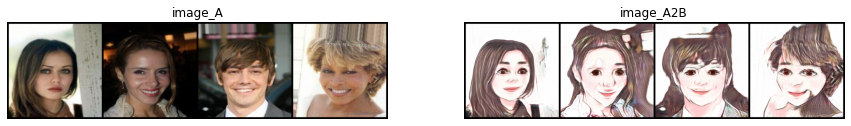

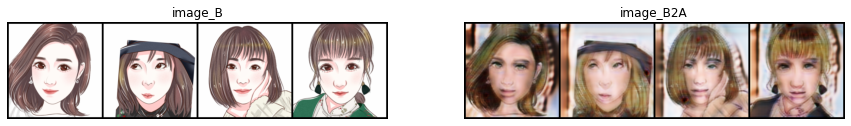

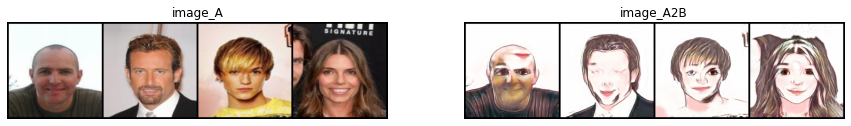

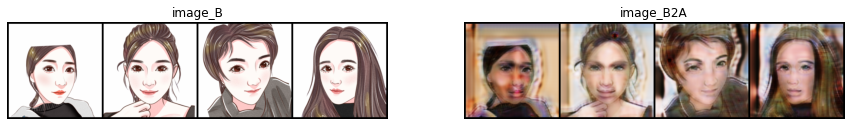

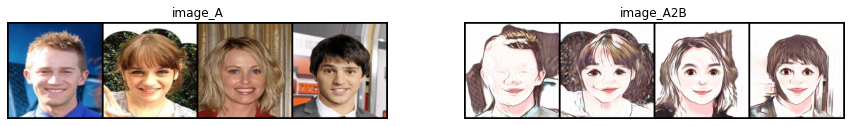

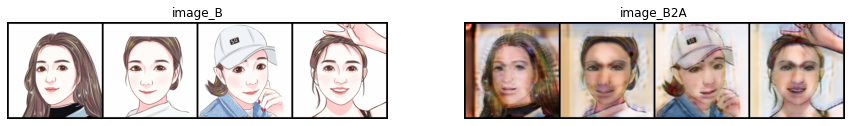

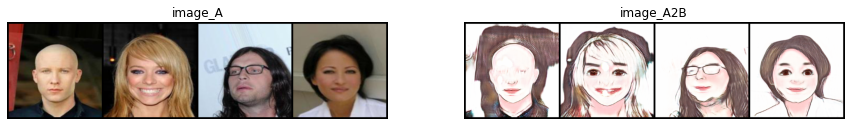

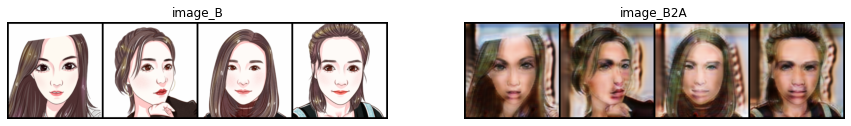

In [72]:
with torch.no_grad():
    for test in test_loader:
        real_image_A1,real_image_B1 = test["A"], test["B"]
        plt.figure(figsize=(15,15))
        plt.subplot(2,2,1)
        plt.axis("off")
        plt.title("image_A")
        plt.imshow(np.transpose(torchvision.utils.make_grid(real_image_A1.to(device), padding=5, normalize=True).cpu(),(1,2,0)))
        fake_image_A2B = 0.5 * (netG_A2B(real_image_A1.to(device).detach()).data + 1.0)
        plt.subplot(2,2,2)
        plt.axis("off")
        plt.title("image_A2B")
        plt.imshow(np.transpose(torchvision.utils.make_grid(fake_image_A2B.to(device), padding=5, normalize=True).cpu(),(1,2,0)))
        plt.show()


        plt.figure(figsize=(15,15))
        plt.subplot(1,2,1)
        plt.axis("off")
        plt.title("image_B")
        plt.imshow(np.transpose(torchvision.utils.make_grid(real_image_B1.to(device), padding=5, normalize=True).cpu(),(1,2,0)))
        fake_image_B2A = 0.5 * (netG_B2A(real_image_B1.to(device).detach()).data + 1.0)
        plt.subplot(1,2,2)
        plt.axis("off")
        plt.title("image_B2A")
        plt.imshow(np.transpose(torchvision.utils.make_grid(fake_image_B2A.to(device), padding=5, normalize=True).cpu(),(1,2,0)))
        plt.show()



In [110]:
picture = test_transform(Image.open('data/face/picture/4.jpg').convert('RGB')).unsqueeze(0)

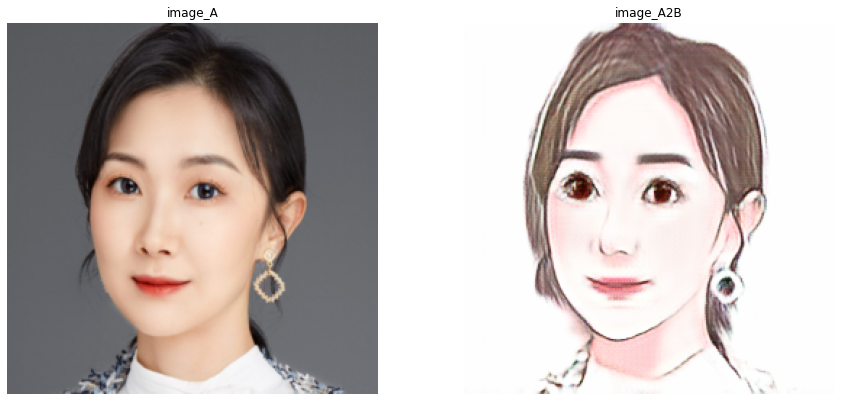

In [111]:
with torch.no_grad():
    real_image_A1 = picture
    plt.figure(figsize=(15,15))
    plt.subplot(2,2,1)
    plt.axis("off")
    plt.title("image_A")
    plt.imshow(np.transpose(torchvision.utils.make_grid(real_image_A1.to(device), padding=5, normalize=True).cpu(),(1,2,0)))
    fake_image_A2B = 0.5 * (netG_A2B(real_image_A1.to(device).detach()).data + 1.0)
    plt.subplot(2,2,2)
    plt.axis("off")
    plt.title("image_A2B")
    plt.imshow(np.transpose(torchvision.utils.make_grid(fake_image_A2B.to(device), padding=5, normalize=True).cpu(),(1,2,0)))
    plt.show()



练习三

（选做）基于CycleGAN来进行年老年轻图片转换。并可尝试如何在模型基础上进行修改以更适合人脸图像。数据来源于[celeba—A](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html)人脸数据，根据属性标签文件`list_attr_celeba.txt`筛选出年老年轻人脸数据，保存在`data/old-young`文件夹中。